In [1]:
"""This module contains simple helper functions """
from __future__ import print_function
import torch
import numpy as np
from PIL import Image
import os
from dataset import dataset_single
from torch.utils.data import DataLoader
import sys
import matplotlib.pyplot as plt
np.set_printoptions(threshold=sys.maxsize)
from torchvision.utils import make_grid
import matplotlib as mpl
mpl.rcParams.update({'figure.max_open_warning': 0})
             
def tensor2im(input_image, imtype=np.uint8):
    """"Converts a Tensor array into a numpy image array.

    Parameters:
        input_image (tensor) --  the input image tensor array
        imtype (type)        --  the desired type of the converted numpy array
    """
    if not isinstance(input_image, np.ndarray):
        if isinstance(input_image, torch.Tensor):  # get the data from a variable
            image_tensor = input_image.data
        else:
            return input_image
        image_numpy = image_tensor[0].clamp(-1.0, 1.0).cpu().float().numpy()  # convert it into a numpy array
        if image_numpy.shape[0] == 1:  # grayscale to RGB
            image_numpy = np.tile(image_numpy, (3, 1, 1))
        image_numpy = (np.transpose(image_numpy, (1, 2, 0)) + 1) / 2.0 * 255.0  # post-processing: tranpose and scaling
    else:  # if it is a numpy array, do nothing
        image_numpy = input_image
    return image_numpy.astype(imtype)


def show(img1, img2, img3):
    f = plt.figure(figsize=(12, 8))
    ax = f.add_subplot(1,3,1)
    fig = plt.imshow(img1)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,3,2)
    fig = plt.imshow(img2)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,3,3)
    fig = plt.imshow(img3)  
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    

def load_eval_model(_path, config_file, ed, ne, target, img_size):
    from omegaconf import OmegaConf
    from main_setting_a import get_obj_from_str, instantiate_from_config
    config = OmegaConf.load(config_file)
    # print(config.model.params.n_embed)
    config.model.target = target
    config.model.z_channels = img_size
    config.model.resolution = img_size
    config.model.params.n_embed = ne
    config.model.params.embed_dim = ed
    model_a = instantiate_from_config(config.model)
    ck = torch.load(_path, map_location=device)
    model_a.load_state_dict(ck['model_state_dict'], strict=False)
    model_a = model_a.to(device)
    return model_a.eval()


def visualize(m, _class, img_size, mode='test', num_test=20):
    
    root = '/eva_data/yujie/datasets/afhq'
    # data loader
    validation_data = dataset_single(root, mode, _class, img_size, img_size, flip=False)
    test_loader = DataLoader(validation_data, batch_size=1, shuffle=False, pin_memory=True)

    print('-----------------------------------------------------------------------------------------')
    print('|          original          |             rec             |         translation        |')
    print('-----------------------------------------------------------------------------------------')
    for i, data in enumerate(test_loader):

        data = data.to(device)

        # forward
        if(_class == 'A'):
            xrec, trans, _ = m(data, label=1)
        elif(_class == 'B'):
            xrec, trans, _ = m(data, label=0)

    #     show(tensor2im(data), make_grid(xrec.cpu().data*0.5+0.5), make_grid(trans.cpu().data*0.5+0.5))
        show(tensor2im(data), tensor2im(xrec), tensor2im(trans))

        if(i == num_test):
            break

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0, 1, 2, 3"
torch.cuda.device_count()

4

In [3]:
device = torch.device('cuda:2' if torch.cuda.is_available() else "cpu")

print(torch.cuda.device_count())

# dataloader
_class = 'A'

mode = 'test'   # or 'train'
ed = 256
ne = 512
img_size = 128
model_name = 'both_afhq_{}_{}_2gloss_1dloss_img{}'.format(ed, ne, img_size)

epoch = 80
m_inorm_path = os.path.join(os.getcwd(), model_name, 'vqgan_{}.pt'.format(epoch))
config = 'config_comb.yaml'
m = load_eval_model(m_inorm_path, config, ed, ne, 'taming_comb.models.vqgan.VQModelCrossGAN', img_size)

4
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


/home/chenyujie/anaconda3/envs/contrastive-unpaired-translation/lib/python3.6/site-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


-----------------------------------------------------------------------------------------
|          original          |             rec             |         translation        |
-----------------------------------------------------------------------------------------


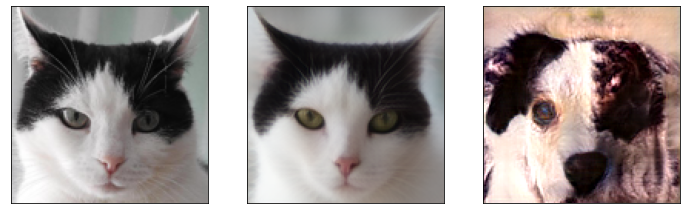

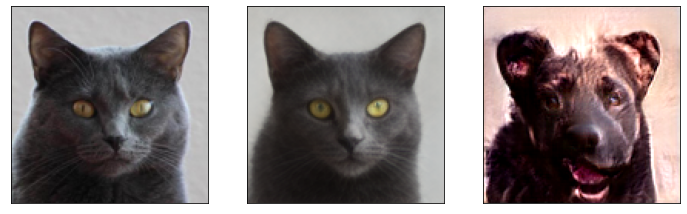

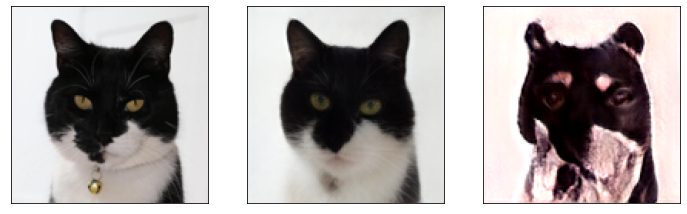

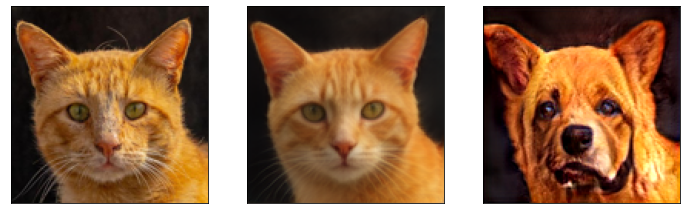

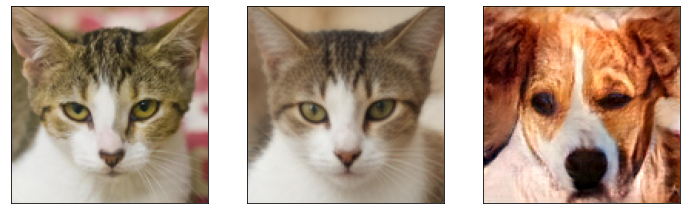

...

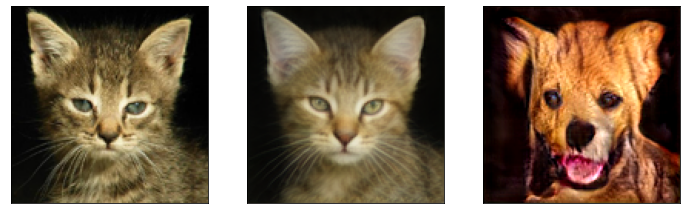

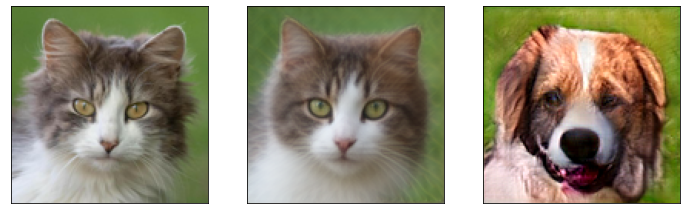

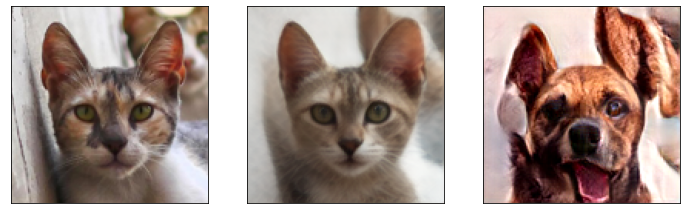

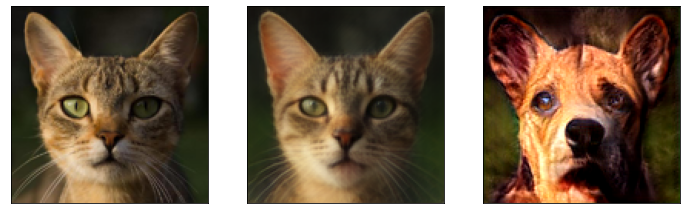

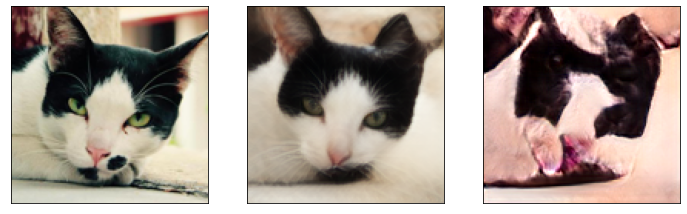

In [4]:
visualize(m, _class='A', img_size=128)

-----------------------------------------------------------------------------------------
|          original          |             rec             |         translation        |
-----------------------------------------------------------------------------------------


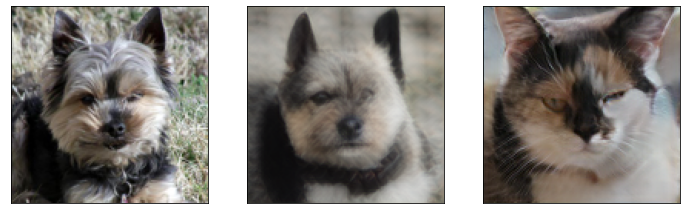

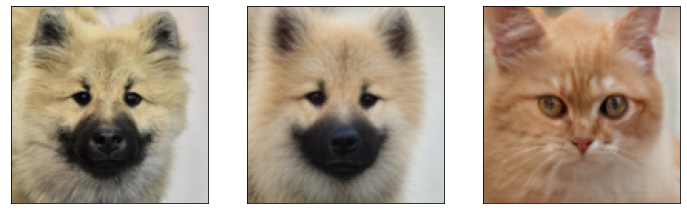

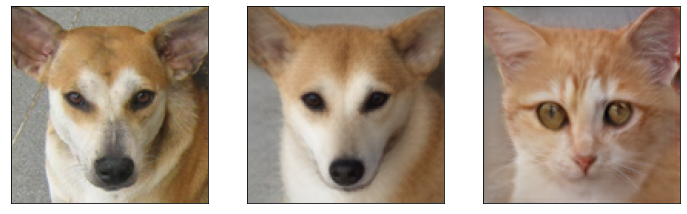

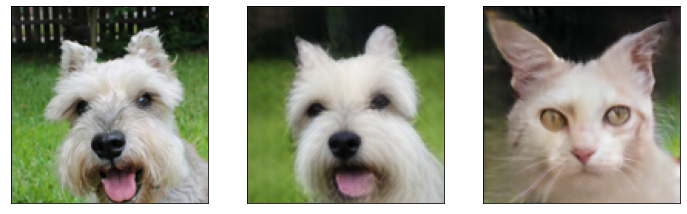

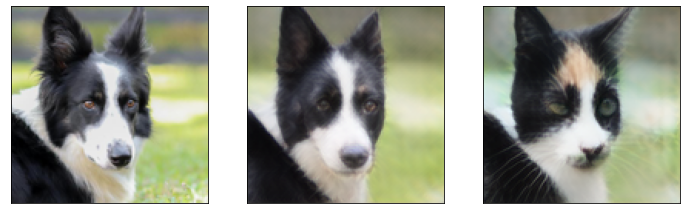

...

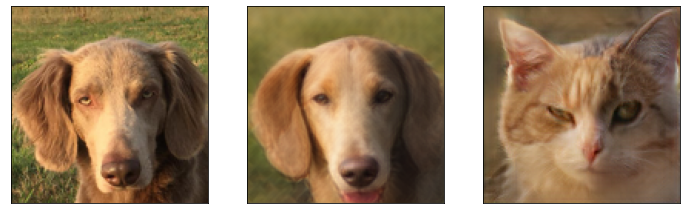

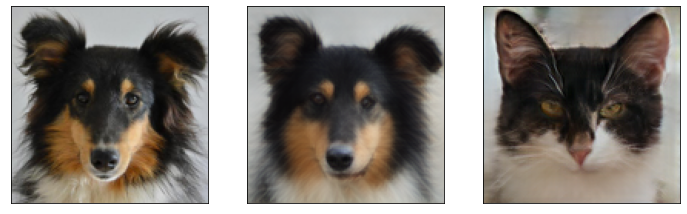

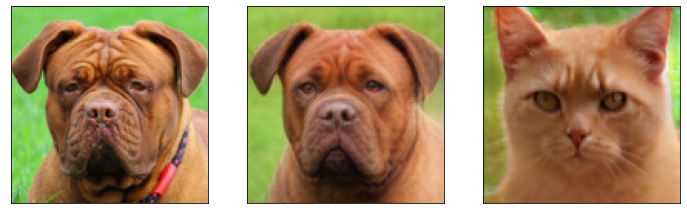

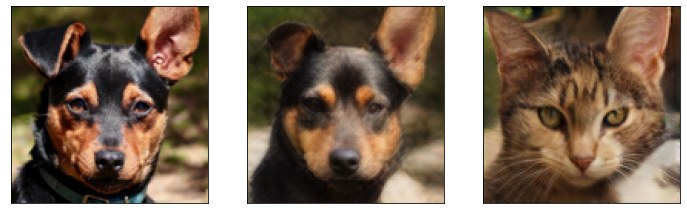

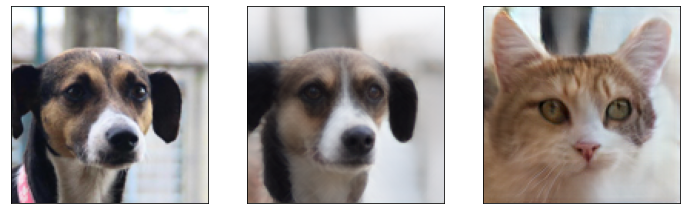

In [5]:
visualize(m, _class='B', img_size=128)

In [6]:
device = torch.device('cuda:2')

# dataloader
_class = 'A'

mode = 'test'   # or 'train'
ed = 256
ne = 512
img_size = 128
model_name = 'both_afhq_{}_{}_2gloss_1dloss_img{}'.format(ed, ne, img_size)

epoch = 50
m_inorm_path = os.path.join(os.getcwd(), model_name, 'vqgan_{}.pt'.format(epoch))
config = 'config_comb.yaml'
m = load_eval_model(m_inorm_path, config, ed, ne, 'taming_comb.models.vqgan.VQModelCrossGAN', img_size)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


-----------------------------------------------------------------------------------------
|          original          |             rec             |         translation        |
-----------------------------------------------------------------------------------------


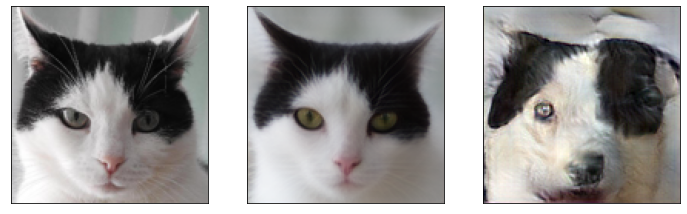

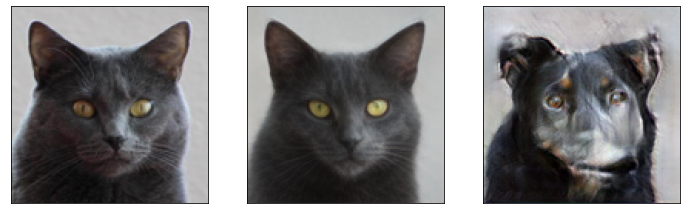

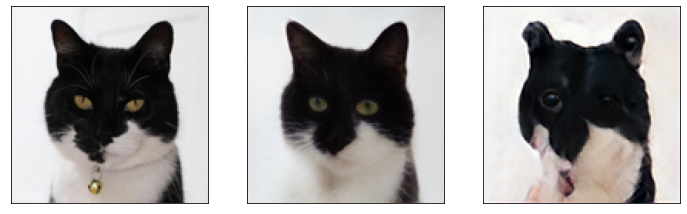

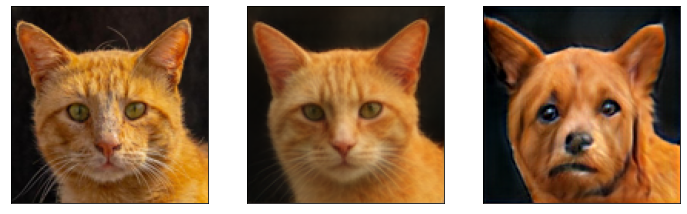

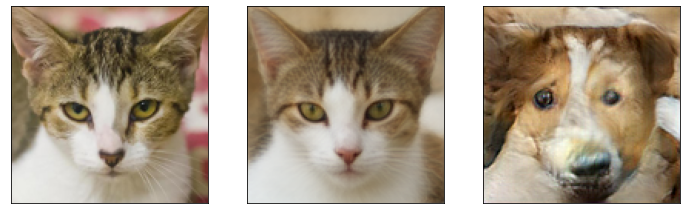

...

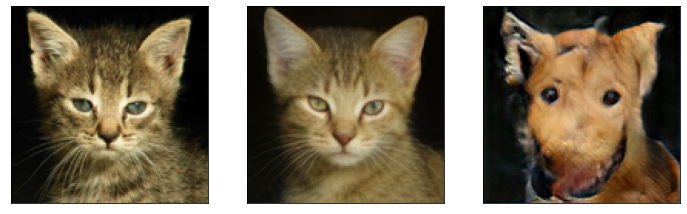

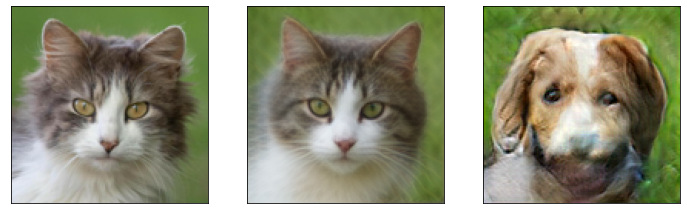

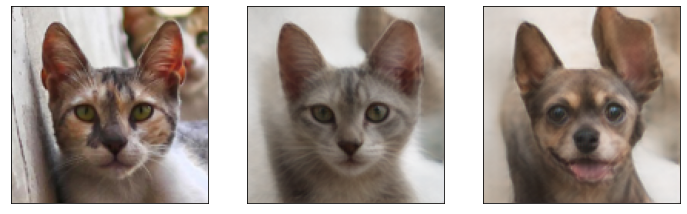

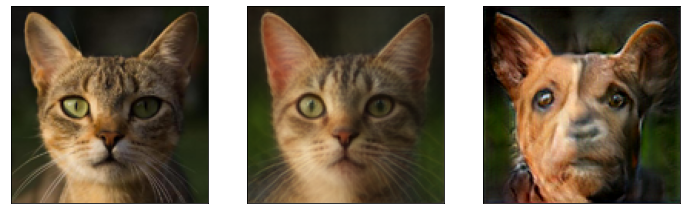

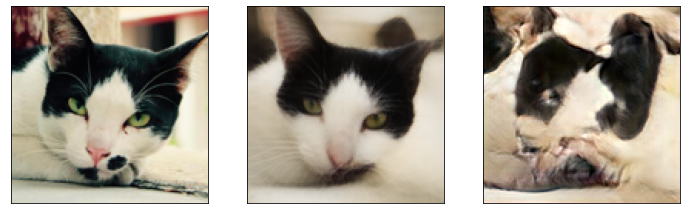

In [7]:
visualize(m, _class='A', img_size=128)

In [ ]:
visualize(m, _class='B', img_size=128)

-----------------------------------------------------------------------------------------
|          original          |             rec             |         translation        |
-----------------------------------------------------------------------------------------
